## 基于单应变矩阵的全景图片拼接方法程序介绍

### 一、程序概述
本程序是一个基于单应矩阵变换的全景图片拼接工具，使用 Python 编写，结合了 OpenCV 进行图像处理和 Tkinter 构建用户界面。它可以让用户选择多张图片，将它们拼接成一张全景图片，并提供了查看拼接过程和保存结果的功能。

__________________________________________________________________________________________________________________________________________________________________________________

### 二、程序依赖库
在运行该程序之前，需要安装以下库：

- cv2：OpenCV 库，用于图像处理和特征点检测。
- numpy：用于数值计算。
- tkinter：Python 的标准 GUI 库，用于创建用户界面。
- PIL：Python Imaging Library，用于图像的处理和显示。

__________________________________________________________________________________________________________________________________________________________________________________

### 三、程序核心类和函数

*1. Stitcher 类*

这个类是图像拼接的核心类，包含了特征点检测、匹配和图像拼接的主要方法。

**代码片段**

In [ ]:
class Stitcher:
    """图像拼接核心类"""

    def __init__(self):
        pass

    def detectAndDescribe(self, image):
        """特征点检测与描述"""
        # 确保图像为8位无符号整型
        if image.dtype != np.uint8:
            image = self.convert_to_uint8(image)

        # 转换为灰度图
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image

        # 创建SIFT特征检测
        descripter = cv2.SIFT_create()
        # 检测关键点记为N点集合kps，计算描述符记为 N*128 数组feature
        (kps, features) = descripter.detectAndCompute(gray, None)
        kps = np.float32([kp.pt for kp in kps])
        return (kps, features)

    # 特征点匹配
    def matchKeypoints(self, kpsA, kpsB, featuresA, featuresB, ratio, reprojThresh):
        matcher = cv2.BFMatcher()  # 创建暴力匹配器：寻找欧式距离最小的特征点匹配

        rawMatches = matcher.knnMatch(featuresA, featuresB, 2)
        # DMatch对象的列表
        # DMatch列表：distance描述符距离，queryIdx查询图A的特征索引，trainIdx训练图B的特征索引

        # Lowe's Ratio Test筛选
        # 对于每个特征点，比较最佳匹配和第二佳匹配的距离，如果最佳匹配距离显著小于次佳匹配距离则接受该匹配
        matches = []
        for m in rawMatches:
            if len(m) == 2 and m[0].distance < m[1].distance * ratio:
                matches.append((m[0].trainIdx, m[0].queryIdx))

        # 确保匹配点数量大于4，提取所有匹配点的坐标
        if len(matches) > 4:
            ptsA = np.float32([kpsA[i] for (_, i) in matches])
            ptsB = np.float32([kpsB[i] for (i, _) in matches])
            # 计算从ptsA到ptsB的投影变换用的那个单应矩阵，status是RANSAC算法标记内点的bool数组
            (H, status) = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, reprojThresh)
            return (matches, H, status)
        return None

    def stitch(self, images, ratio=0.75, reprojThresh=4.0, showMatches=False):
        """图像拼接主函数"""
        (imageB, imageA) = images
        # 检测A B特征关键点，并计算特征描述子
        (kpsA, featuresA) = self.detectAndDescribe(imageA)
        (kpsB, featuresB) = self.detectAndDescribe(imageB)

        # 匹配两张图片的所有特征点，返回匹配结果记为变换矩阵M
        # (关键点，特征描述符，模糊匹配阈值，RANSAC算法的投影误差阈值)
        M = self.matchKeypoints(kpsA, kpsB, featuresA, featuresB, ratio, reprojThresh)
        # 检测是否成功匹配（RANSAC要求有大于四个匹配点）         
        if M is None:
            return None, "特征点匹配不足，拼接失败", None, None
        
        # 匹配结果(匹配点对索引，单应矩阵(棋盘格透视),标记哪个匹配点符合单应变换)
        (matches, H, status) = M
        hA, wA = imageA.shape[:2]
        hB, wB = imageB.shape[:2]

        # 对a应用透视变换，参考图形为b，公式：[X`,Y`,1] = H[x,y,1]
        # 拼接后大小为（a宽+b宽，a高）
        # 计算图像A变换后的四个角点
        cornersA = np.array([[0, 0], [0, hA], [wA, hA], [wA, 0]], dtype=np.float32)
        cornersA = cornersA.reshape(-1, 1, 2)
        transformedCorners = cv2.perspectiveTransform(cornersA, H)

        # 计算画布尺寸
        allCorners = np.concatenate((transformedCorners.reshape(4, 2),
                                     np.array([[0, 0], [0, hB], [wB, hB], [wB, 0]])))
        [x_min, y_min] = np.floor(allCorners.min(axis=0)).astype(int)
        [x_max, y_max] = np.ceil(allCorners.max(axis=0)).astype(int)

        # 平移变换
        tx, ty = -x_min, -y_min
        translationMatrix = np.array([[1, 0, tx], [0, 1, ty], [0, 0, 1]])
        adjustedH = translationMatrix.dot(H)

        # 透视变换
        new_width, new_height = int(x_max - x_min), int(y_max - y_min)
        warpedA = cv2.warpPerspective(imageA, adjustedH, (new_width, new_height))

        # 创建新画布并放置图像B
        result = np.zeros((new_height, new_width, 3), dtype=np.uint8)
        result[ty:ty + hB, tx:tx + wB] = imageB
        
        # 创建掩码并融合图像
        mask = np.zeros((new_height, new_width), dtype=np.uint8)
        mask[ty:ty + hB, tx:tx + wB] = 255
        result = np.where(mask[..., None].astype(bool), result, warpedA)

        # 可视化匹配点
        if showMatches:
            vis = self.drawMatches(imageA, imageB, kpsA, kpsB, matches, status)
            return result, vis, matches, warpedA
        return result, None, matches, warpedA

    def drawMatches(self, imageA, imageB, kpsA, kpsB, matches, status):
        """绘制匹配的特征点（使用随机颜色）"""
        (hA, wA) = imageA.shape[:2]
        (hB, wB) = imageB.shape[:2]
        vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")
        vis[0:hA, 0:wA] = imageA
        vis[0:hB, wA:] = imageB

        # 为每一对匹配点生成随机颜色
        for ((trainIdx, queryIdx), s) in zip(matches, status):
            if s == 1:
                # 生成随机颜色 (B, G, R)
                color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
                ptA = (int(kpsA[queryIdx][0]), int(kpsA[queryIdx][1]))
                ptB = (int(kpsB[trainIdx][0]) + wA, int(kpsB[trainIdx][1]))
                cv2.line(vis, ptA, ptB, color, 1)
                # 在特征点处绘制小圆点
                cv2.circle(vis, ptA, 2, color, -1)
                cv2.circle(vis, ptB, 2, color, -1)

        return vis

    def convert_to_uint8(self, image):
        """转换图像为8位无符号整型"""
        if image.dtype == np.uint8:
            return image
        if np.issubdtype(image.dtype, np.floating):
            return (image * 255).clip(0, 255).astype(np.uint8)
        if image.dtype == np.uint16:
            return (image / 65535 * 255).clip(0, 255).astype(np.uint8)
        return image.astype(np.uint8)

**主要方法说明**

- detectAndDescribe：检测图像中的特征点并计算其描述符。
- matchKeypoints：匹配两张图像的特征点，并使用 RANSAC 算法计算单应矩阵。
- stitch：图像拼接的主函数，将两张图像拼接成一张。
- drawMatches：绘制匹配的特征点。
- convert_to_uint8：将图像转换为 8 位无符号整型。

*2. ImageStitcherUI 类*

这个类用于创建用户界面，让用户可以选择图片、开始拼接、保存结果等。

In [ ]:
class ImageStitcherUI:
    """图像拼接UI界面"""

    def __init__(self, root):
        self.root = root
        self.root.title("图像拼接工具")
        self.root.geometry("1400x900")  # 增加窗口大小以容纳更多内容
        self.root.resizable(True, True)

        # 图像路径列表
        self.image_paths = []
        self.images = []
        self.steps_data = []  # 存储每一步的数据（匹配结果和拼接结果）

        # 创建UI组件
        self.create_widgets()

    def create_widgets(self):
        """创建UI组件"""
        # 顶部控制区
        control_frame = ttk.Frame(self.root, padding=10)
        control_frame.pack(fill=tk.X)

        # 选择图像按钮
        self.select_btn = ttk.Button(
            control_frame, text="选择图像", command=self.select_images
        )
        self.select_btn.pack(side=tk.LEFT, padx=5)

        # 拼接按钮
        self.stitch_btn = ttk.Button(
            control_frame, text="开始拼接", command=self.start_stitching
        )
        self.stitch_btn.pack(side=tk.LEFT, padx=5)

        # 保存结果按钮
        self.save_btn = ttk.Button(
            control_frame, text="保存结果", command=self.save_result, state=tk.DISABLED
        )
        self.save_btn.pack(side=tk.LEFT, padx=5)

        # 反转顺序按钮
        self.reverse_btn = ttk.Button(
            control_frame, text="反转顺序", command=self.reverse_image_order
        )
        self.reverse_btn.pack(side=tk.LEFT, padx=5)

        # 显示匹配点按钮
        self.show_matches_var = tk.BooleanVar(value=False)
        self.show_matches_btn = ttk.Checkbutton(
            control_frame, text="显示拼接过程", variable=self.show_matches_var
        )
        self.show_matches_btn.pack(side=tk.LEFT, padx=5)

        # 状态标签
        self.status_label = ttk.Label(control_frame, text="请选择需要拼接的图像（支持多张）")
        self.status_label.pack(side=tk.RIGHT, padx=5)

        # 图像显示区（使用Notebook分标签）
        self.notebook = ttk.Notebook(self.root)
        self.notebook.pack(fill=tk.BOTH, expand=True, padx=10, pady=5)

        # 原图标签页
        self.source_frame = ttk.Frame(self.notebook)
        self.notebook.add(self.source_frame, text="原始图像")
        self.source_canvas = tk.Canvas(self.source_frame)
        self.source_scroll_x = ttk.Scrollbar(self.source_frame, orient=tk.HORIZONTAL, command=self.source_canvas.xview)
        self.source_scroll_y = ttk.Scrollbar(self.source_frame, orient=tk.VERTICAL, command=self.source_canvas.yview)
        self.source_canvas.configure(xscrollcommand=self.source_scroll_x.set, yscrollcommand=self.source_scroll_y.set)
        self.source_scroll_x.pack(side=tk.BOTTOM, fill=tk.X)
        self.source_scroll_y.pack(side=tk.RIGHT, fill=tk.Y)
        self.source_canvas.pack(fill=tk.BOTH, expand=True)
        self.source_frame_inner = ttk.Frame(self.source_canvas)
        self.source_canvas.create_window((0, 0), window=self.source_frame_inner, anchor=tk.NW)
        self.source_frame_inner.bind("<Configure>", self.on_source_configure)

        # 结果标签页
        self.result_frame = ttk.Frame(self.notebook)
        self.notebook.add(self.result_frame, text="最终拼接结果")
        self.result_canvas = tk.Canvas(self.result_frame)
        self.result_canvas.pack(fill=tk.BOTH, expand=True)

        # 过程标签页框架（将在此框架内创建多个标签页）
        self.process_frame = ttk.Frame(self.notebook)
        self.notebook.add(self.process_frame, text="拼接过程")
        
        # 在过程框架内创建另一个Notebook用于显示多个步骤
        self.process_notebook = ttk.Notebook(self.process_frame)
        self.process_notebook.pack(fill=tk.BOTH, expand=True, padx=5, pady=5)
        
        # 初始标签页
        self.step_frames = []

    def on_source_configure(self, event):
        """更新原图显示区滚动范围"""
        self.source_canvas.configure(scrollregion=self.source_canvas.bbox("all"))

    def select_images(self):
        """选择图像文件"""
        filetypes = (
            ("图像文件", "*.jpg *.jpeg *.png *.bmp *.gif"),
            ("所有文件", "*.*")
        )

        paths = filedialog.askopenfilenames(
            title="选择需要拼接的图像",
            initialdir=".",
            filetypes=filetypes
        )

        if not paths:
            return

        # 清空之前的图像
        self.image_paths = list(paths)
        self.images = []
        for widget in self.source_frame_inner.winfo_children():
            widget.destroy()

        # 读取并显示新图像
        valid_count = 0
        for i, path in enumerate(self.image_paths):
            try:
                img = cv2.imread(path)
                if img is None:
                    raise Exception("无法读取图像")
                self.images.append(img)
                valid_count += 1

                # 转换为PIL图像并显示
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                pil_img = Image.fromarray(img_rgb)
                # 缩放图像以便显示（最大宽度300）
                max_width = 300
                w, h = pil_img.size
                if w > max_width:
                    ratio = max_width / w
                    pil_img = pil_img.resize((int(w * ratio), int(h * ratio)), Image.LANCZOS)
                tk_img = ImageTk.PhotoImage(image=pil_img)

                # 创建图像容器
                frame = ttk.LabelFrame(self.source_frame_inner, text=f"图像 {i + 1}: {os.path.basename(path)}")
                frame.grid(row=i // 2, column=i % 2, padx=5, pady=5, sticky=tk.NSEW)
                label = ttk.Label(frame, image=tk_img)
                label.image = tk_img  # 保持引用
                label.pack(padx=5, pady=5)

            except Exception as e:
                messagebox.showerror("读取失败", f"无法读取图像 {path}：{str(e)}")

        # 更新状态
        self.status_label.config(text=f"已选择 {valid_count} 张有效图像")
        if valid_count >= 2:
            self.stitch_btn.config(state=tk.NORMAL)
        else:
            self.stitch_btn.config(state=tk.DISABLED)
            messagebox.showwarning("警告", "至少需要选择2张图像才能进行拼接")

    def start_stitching(self):
        """开始拼接图像"""
        if len(self.images) < 2:
            messagebox.showwarning("警告", "请至少选择2张图像")
            return

        # 清空之前的数据
        self.steps_data = []
        self.clear_process_tabs()

        self.status_label.config(text="正在拼接图像...")
        self.root.update()  # 刷新UI显示状态

        try:
            stitcher = Stitcher()
            result = self.images[0]

            # 多图级联拼接
            for i in range(1, len(self.images)):
                self.status_label.config(text=f"正在拼接第 {i + 1}/{len(self.images)} 张图像...")
                self.root.update()

                # 拼接当前结果与下一张图像
                show_matches = self.show_matches_var.get()
                temp_result, vis, matches_info, warped = stitcher.stitch(
                    [self.images[i], result], 
                    showMatches=show_matches
                )

                if temp_result is None:
                    self.status_label.config(text=f"拼接失败：{vis}")
                    return
                
                # 存储每一步的数据
                if show_matches:
                    self.steps_data.append({
                        "step": i,
                        "image_index": i,
                        "matches_image": vis,
                        "stitch_result": temp_result.copy(),
                        "warped_image": warped.copy()
                    })
                
                result = temp_result

            # 显示最终结果
            self.stitch_result = result
            self.display_result()
            self.status_label.config(text=f"拼接完成，共处理 {len(self.images)} 张图像")
            self.save_btn.config(state=tk.NORMAL)

            # 显示所有步骤的拼接过程
            if self.show_matches_var.get() and self.steps_data:
                self.display_all_steps()

        except Exception as e:
            self.status_label.config(text=f"拼接出错：{str(e)}")
            messagebox.showerror("错误", f"拼接过程出错：{str(e)}")

    def clear_process_tabs(self):
        """清除之前的拼接过程标签页"""
        # 删除除初始框架外的所有标签页
        for tab_id in self.process_notebook.tabs():
            self.process_notebook.forget(tab_id)
        
        # 清空步骤框架列表
        self.step_frames = []

    def reverse_image_order(self):
        """反转图像顺序并刷新显示"""
        if len(self.images) < 2:
            messagebox.showwarning("提示", "至少需要两张图像才能反转顺序")
            return

        # 反转图像和路径
        self.images.reverse()
        self.image_paths.reverse()

        # 清空原图显示区域
        for widget in self.source_frame_inner.winfo_children():
            widget.destroy()

        # 重新显示图像
        for i, img in enumerate(self.images):
            try:
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                pil_img = Image.fromarray(img_rgb)
                max_width = 300
                w, h = pil_img.size
                if w > max_width:
                    ratio = max_width / w
                    pil_img = pil_img.resize((int(w * ratio), int(h * ratio)), Image.LANCZOS)
                tk_img = ImageTk.PhotoImage(image=pil_img)

                frame = ttk.LabelFrame(self.source_frame_inner, text=f"图像 {i + 1}: {os.path.basename(self.image_paths[i])}")
                frame.grid(row=i // 2, column=i % 2, padx=5, pady=5, sticky=tk.NSEW)
                label = ttk.Label(frame, image=tk_img)
                label.image = tk_img  # 保持引用
                label.pack(padx=5, pady=5)

            except Exception as e:
                messagebox.showerror("显示失败", f"无法显示图像 {self.image_paths[i]}：{str(e)}")

        self.status_label.config(text=f"图像顺序已反转，共 {len(self.images)} 张图像")

    def display_all_steps(self):
        """显示所有步骤的拼接过程"""
        if not self.steps_data:
            return
            
        for i, step_data in enumerate(self.steps_data):
            step = step_data["step"]
            
            # 创建新标签页
            step_frame = ttk.Frame(self.process_notebook)
            self.process_notebook.add(step_frame, text=f"步骤 {step} (图像 {step} 与 {step+1})")
            
            # 创建左右分割面板
            paned_window = ttk.PanedWindow(step_frame, orient=tk.HORIZONTAL)
            paned_window.pack(fill=tk.BOTH, expand=True, padx=5, pady=5)
            
            # 左侧面板：特征匹配图
            left_frame = ttk.Frame(paned_window)
            paned_window.add(left_frame, weight=1)
            
            left_label = ttk.Label(left_frame, text="特征匹配结果", font=("Arial", 10, "bold"))
            left_label.pack(pady=5)
            
            matches_canvas = tk.Canvas(left_frame)
            matches_canvas.pack(fill=tk.BOTH, expand=True, padx=5, pady=5)
            
            # 右侧面板：拼接结果
            right_frame = ttk.Frame(paned_window)
            paned_window.add(right_frame, weight=1)
            
            right_label = ttk.Label(right_frame, text="拼接结果", font=("Arial", 10, "bold"))
            right_label.pack(pady=5)
            
            stitch_canvas = tk.Canvas(right_frame)
            stitch_canvas.pack(fill=tk.BOTH, expand=True, padx=5, pady=5)
            
            # 显示特征匹配图
            matches_img = step_data["matches_image"]
            matches_img_rgb = cv2.cvtColor(matches_img, cv2.COLOR_BGR2RGB)
            matches_pil = Image.fromarray(matches_img_rgb)
            matches_pil.thumbnail((600, 400), Image.LANCZOS)
            matches_tk = ImageTk.PhotoImage(image=matches_pil)
            
            matches_canvas.config(width=matches_pil.width, height=matches_pil.height)
            matches_canvas.create_image(0, 0, image=matches_tk, anchor=tk.NW)
            matches_canvas.image = matches_tk  # 保持引用
            
            # 显示拼接结果
            stitch_img = step_data["stitch_result"]
            stitch_img_rgb = cv2.cvtColor(stitch_img, cv2.COLOR_BGR2RGB)
            stitch_pil = Image.fromarray(stitch_img_rgb)
            stitch_pil.thumbnail((600, 400), Image.LANCZOS)
            stitch_tk = ImageTk.PhotoImage(image=stitch_pil)
            
            stitch_canvas.config(width=stitch_pil.width, height=stitch_pil.height)
            stitch_canvas.create_image(0, 0, image=stitch_tk, anchor=tk.NW)
            stitch_canvas.image = stitch_tk  # 保持引用

    def display_result(self):
        """显示最终拼接结果"""
        if self.stitch_result is None:
            return

        # 转换为RGB并调整大小以便显示
        img_rgb = cv2.cvtColor(self.stitch_result, cv2.COLOR_BGR2RGB)
        pil_img = Image.fromarray(img_rgb)

        # 限制最大显示尺寸（防止过大）
        max_size = (1200, 800)
        pil_img.thumbnail(max_size, Image.LANCZOS)
        tk_img = ImageTk.PhotoImage(image=pil_img)

        # 显示在画布上
        self.result_canvas.delete("all")
        self.result_canvas.config(width=pil_img.width, height=pil_img.height)
        self.result_canvas.create_image(0, 0, image=tk_img, anchor=tk.NW)
        self.result_canvas.image = tk_img  # 保持引用

    def save_result(self):
        """保存拼接结果"""
        if self.stitch_result is None:
            return

        # 询问保存路径
        filepath = filedialog.asksaveasfilename(
            defaultextension=".png",
            filetypes=[("PNG图像", "*.png"), ("JPEG图像", "*.jpg"), ("所有文件", "*.*")],
            title="保存拼接结果"
        )

        if not filepath:
            return

        try:
            cv2.imwrite(filepath, self.stitch_result)
            self.status_label.config(text=f"结果已保存至：{filepath}")
            messagebox.showinfo("成功", f"图像已保存至：{filepath}")
        except Exception as e:
            messagebox.showerror("保存失败", f"无法保存图像：{str(e)}")

**主要方法说明**

- create_widgets：创建用户界面的各种组件，如按钮、标签、画布等。
- select_images：让用户选择需要拼接的图像文件，并显示在界面上。
- start_stitching：开始拼接图像，并显示拼接结果和过程。
- reverse_image_order：反转图像的拼接顺序。
- display_all_steps：显示拼接过程的每一步结果。
- display_result：显示最终的拼接结果。
- save_result：保存拼接结果到指定的文件。

__________________________________________________________________________________________________________________________________________________________________________________

### 四、程序使用方法

**1. 启动程序**



In [ ]:
if __name__ == "__main__":
    import tkinter as tk

    root = tk.Tk()
    app = ImageStitcherUI(root)
    root.mainloop()

运行上述代码后，系统弹出图像拼接工具窗口。

**2. 选择图像**

点击 【选择图像】 按钮，选择需要拼接的图像文件。程序会自动读取并显示这些图像。

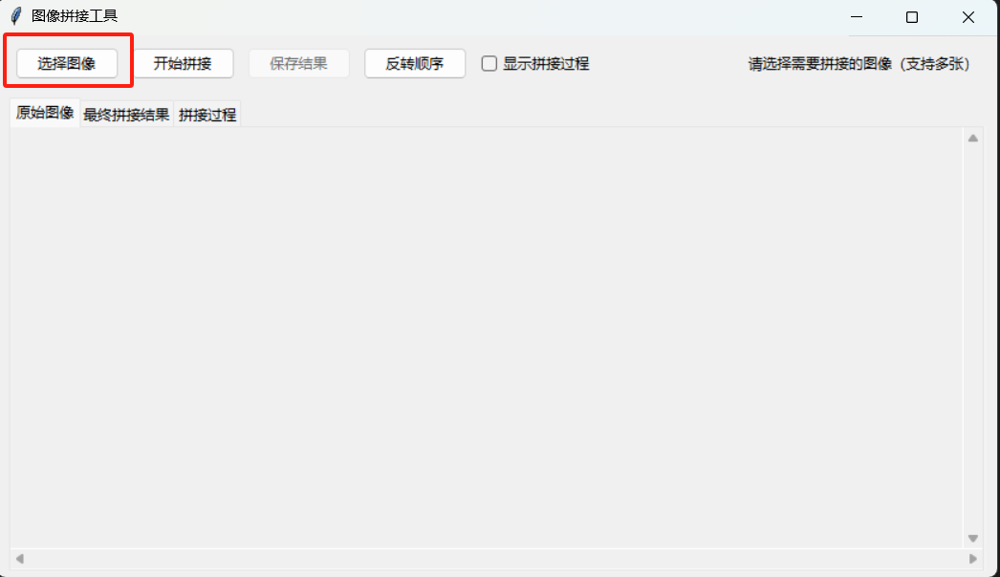

**3. 开始拼接**

确保至少选择了两张图像，然后点击 【开始拼接】 按钮。程序会开始拼接图像，并在【最终拼接结果】标签中显示拼接过程和最终结果。

（此处分别以双图拼接和多图级联拼接作为例子）

*双图拼接以及结果*

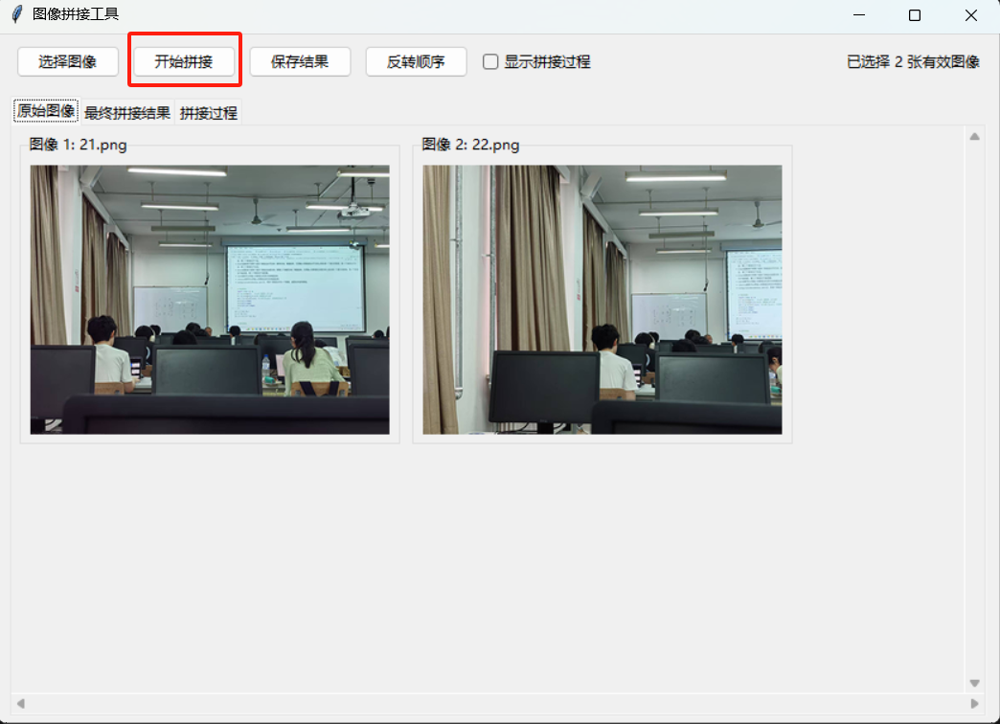
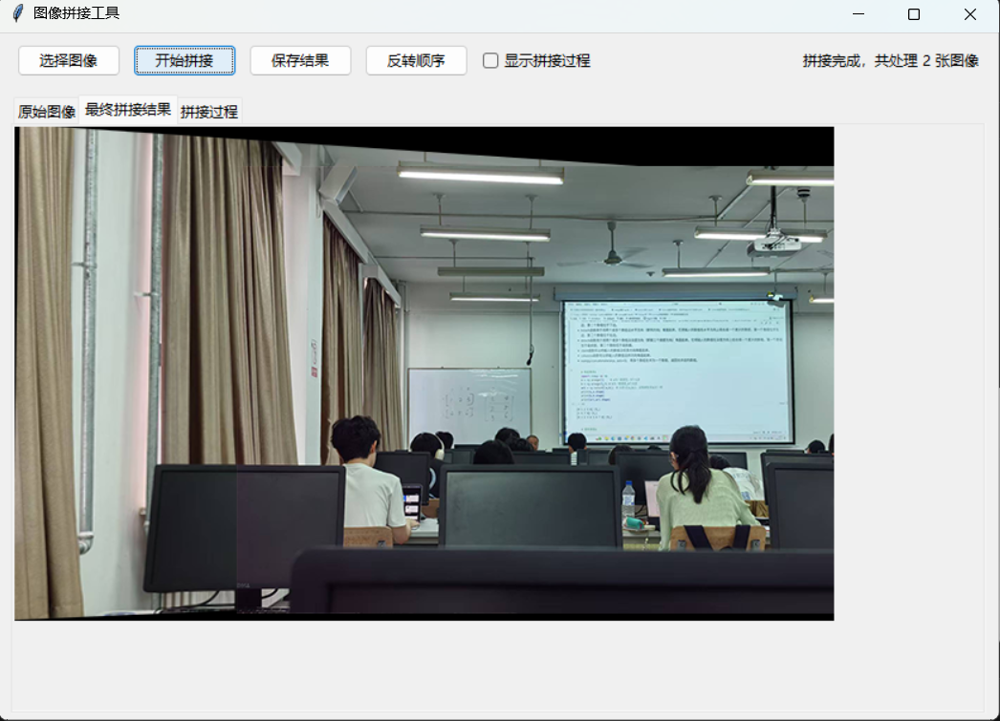

*多图拼接以及结果*

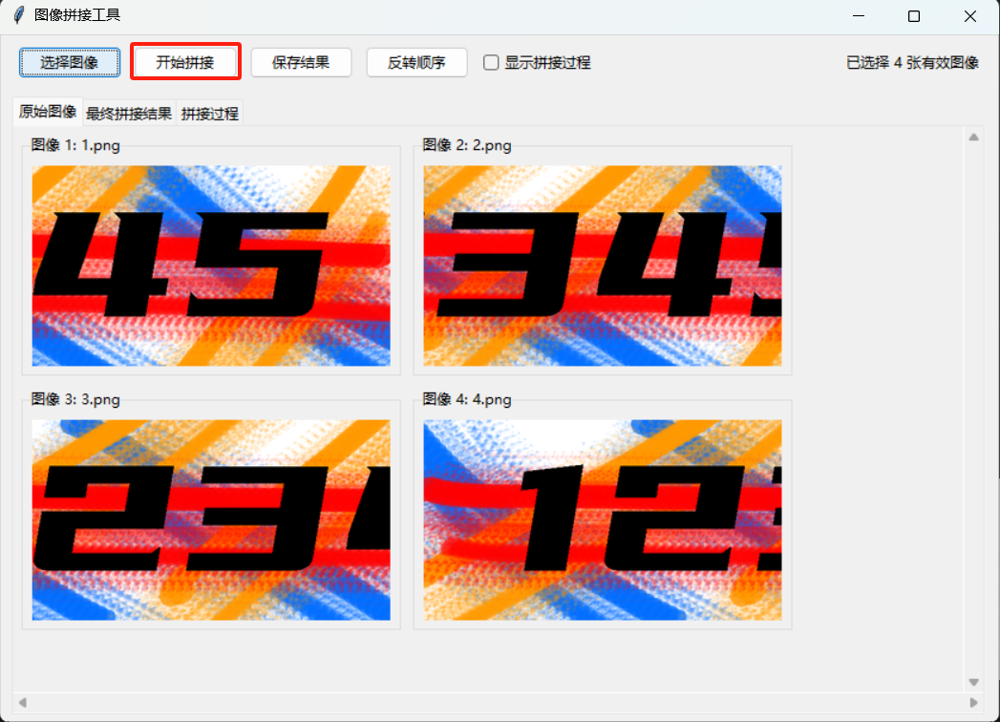
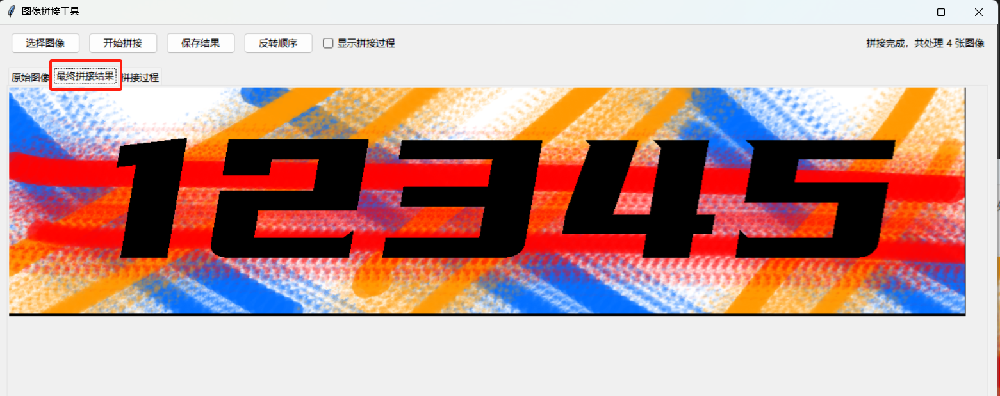

**4. 显示拼接过程**

在拼接实际图像过程中，多图级联拼接可能因为某一次独立拼接的结果出现问题导致最终效果不理想。


如果需要查看拼接过程，可以勾选 【显示拼接过程】选项，然后再点击 【开始拼接】按钮。


选择后，每一步拼接结果和匹配结果将可视化在【拼接过程】标签中，可以通过分标签查看每一步操作内容。

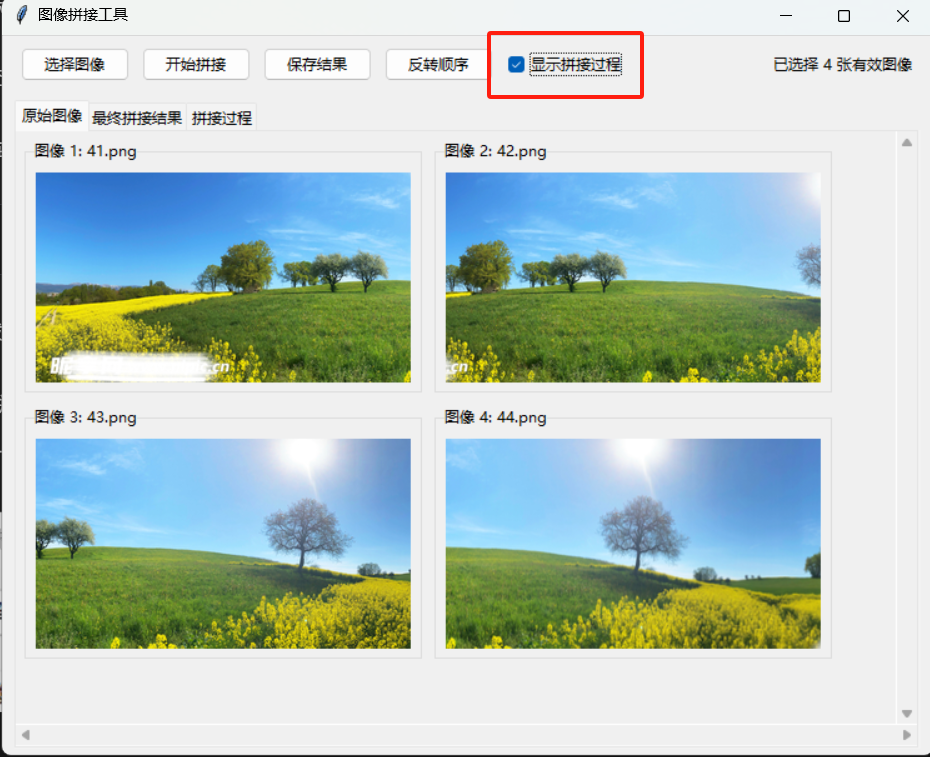
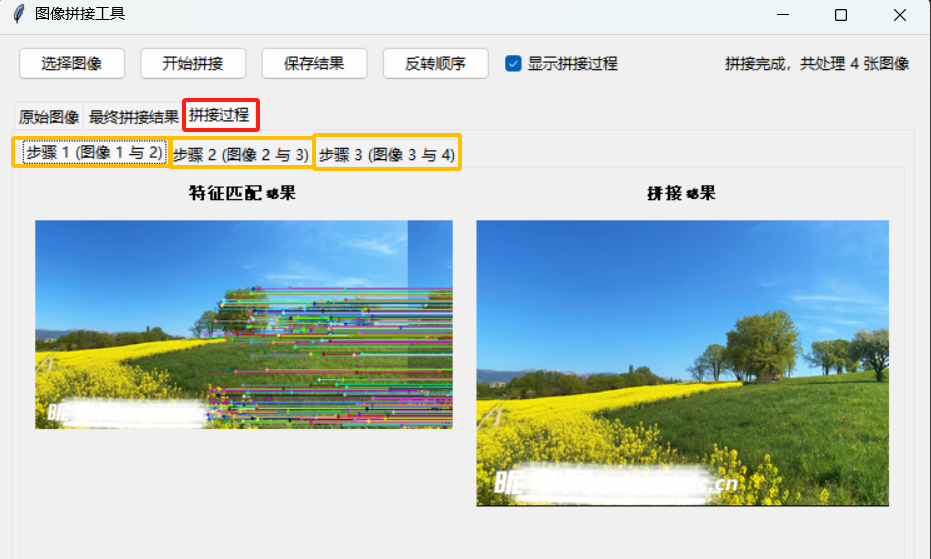

由于拼接的逻辑为**以后输入图片为视角参考，将前输入图片变换后拼接**，因此当我们使用的最后一张原始图像出现一定角度的变形时，我们可以发现拼接效果并不理想，因此我们可以进行下一步操作。

5. 反转拼接顺序

当拼接效果不理想时，可以选择【反转顺序】，将原来输入的图片倒序输入，以改变参考图视角

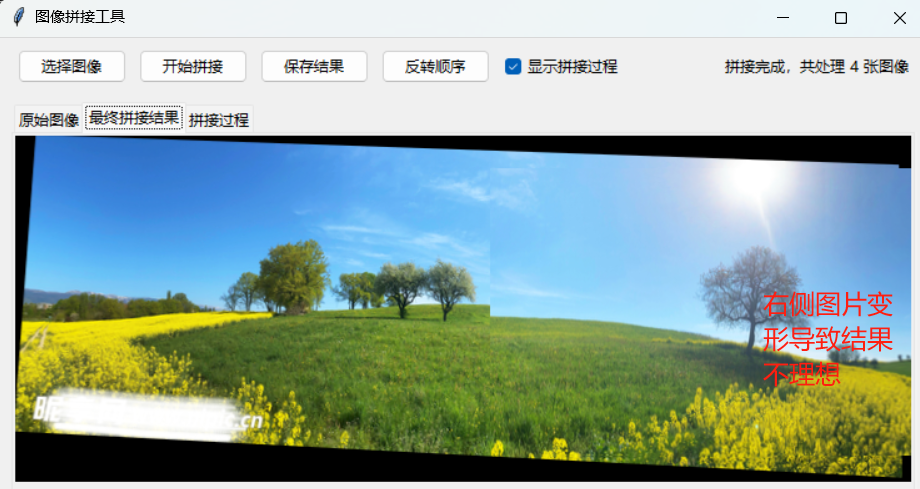
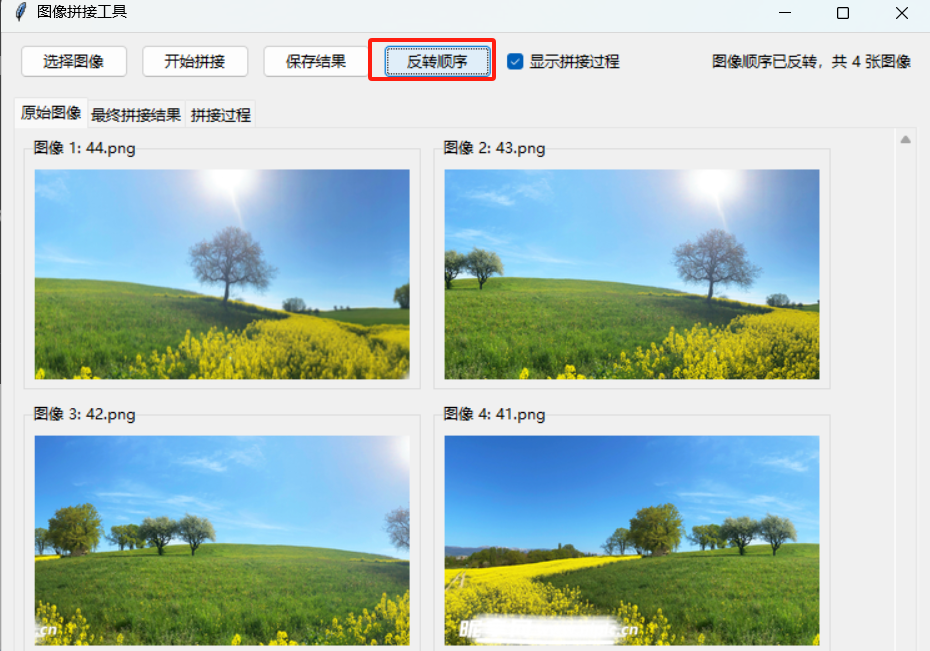

以下为调整顺序后重新生成结果

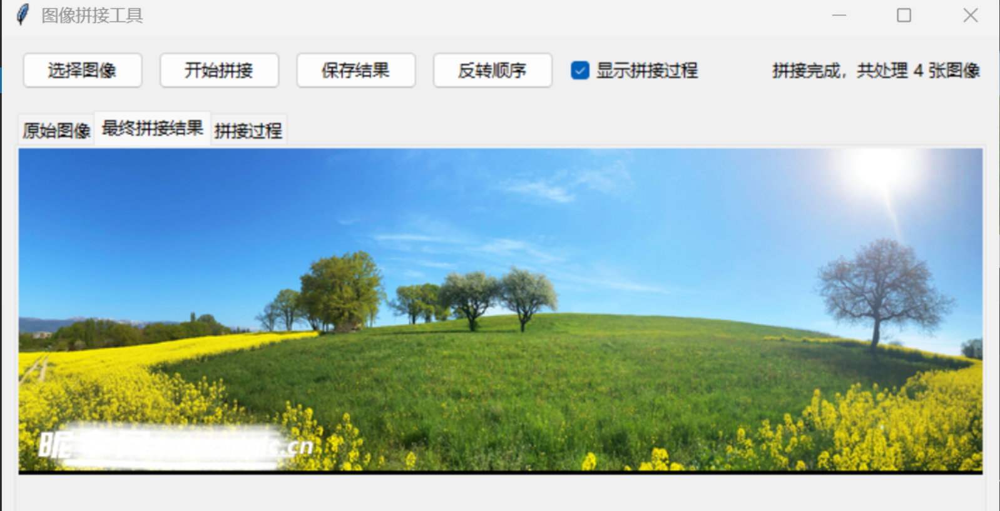

**6. 保存结果**

拼接完成后，点击 【保存结果】按钮，选择保存路径和文件格式，即可保存拼接结果

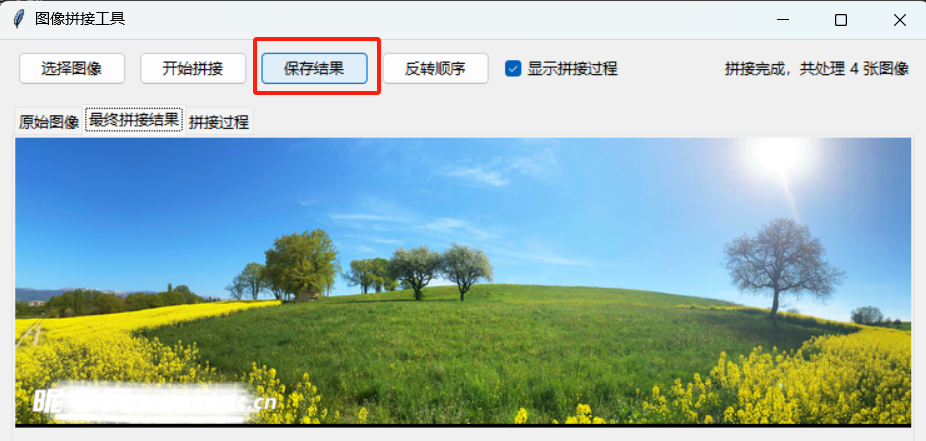

_________________________________________________________________________________________________________________________________________________________________________________

### 五、注意事项

- 程序要求至少选择两张图像才能进行拼接。
- 如果图像无法读取，程序会弹出错误提示。
- 拼接过程可能需要一定的时间，具体取决于图像的大小和数量。
- 如果拼接图片总数较多，可以先选择少量图片进行拼接后将结果进行拼接，或在多图级联拼接过程中打开【显示过程】，寻找拼接过程中对视角负面影响最大的过程，对其单独进行拼接
